<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Wikipedia-Movie-Plots---EDA-and-Vector-Generation" data-toc-modified-id="Wikipedia-Movie-Plots---EDA-and-Vector-Generation-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Wikipedia Movie Plots - EDA and Vector Generation</a></span><ul class="toc-item"><li><span><a href="#Data-Import" data-toc-modified-id="Data-Import-1.1"><span class="toc-item-num">1.1&nbsp;&nbsp;</span>Data Import</a></span></li><li><span><a href="#Data-Cleaning" data-toc-modified-id="Data-Cleaning-1.2"><span class="toc-item-num">1.2&nbsp;&nbsp;</span>Data Cleaning</a></span></li><li><span><a href="#Analysis-of-Genres-Through-Clustering" data-toc-modified-id="Analysis-of-Genres-Through-Clustering-1.3"><span class="toc-item-num">1.3&nbsp;&nbsp;</span>Analysis of Genres Through Clustering</a></span></li><li><span><a href="#Exploratory-Data-Analysis" data-toc-modified-id="Exploratory-Data-Analysis-1.4"><span class="toc-item-num">1.4&nbsp;&nbsp;</span>Exploratory Data Analysis</a></span><ul class="toc-item"><li><span><a href="#Movies-by-Release-Year" data-toc-modified-id="Movies-by-Release-Year-1.4.1"><span class="toc-item-num">1.4.1&nbsp;&nbsp;</span>Movies by Release Year</a></span></li><li><span><a href="#Top-Genres" data-toc-modified-id="Top-Genres-1.4.2"><span class="toc-item-num">1.4.2&nbsp;&nbsp;</span>Top Genres</a></span></li><li><span><a href="#Top-Directors" data-toc-modified-id="Top-Directors-1.4.3"><span class="toc-item-num">1.4.3&nbsp;&nbsp;</span>Top Directors</a></span></li><li><span><a href="#Top-Casts" data-toc-modified-id="Top-Casts-1.4.4"><span class="toc-item-num">1.4.4&nbsp;&nbsp;</span>Top Casts</a></span></li></ul></li><li><span><a href="#Create-a-Pivot-Table-for-Export-to-Flourish" data-toc-modified-id="Create-a-Pivot-Table-for-Export-to-Flourish-1.5"><span class="toc-item-num">1.5&nbsp;&nbsp;</span>Create a Pivot Table for Export to Flourish</a></span></li><li><span><a href="#Generate-Vectors-and-Save" data-toc-modified-id="Generate-Vectors-and-Save-1.6"><span class="toc-item-num">1.6&nbsp;&nbsp;</span>Generate Vectors and Save</a></span></li><li><span><a href="#References" data-toc-modified-id="References-1.7"><span class="toc-item-num">1.7&nbsp;&nbsp;</span>References</a></span></li></ul></li></ul></div>

# Wikipedia Movie Plots - EDA and Vector Generation

In [1]:
import pandas as pd
import numpy as np
import pandas_profiling
import regex as re
from nltk.tokenize import RegexpTokenizer
from nltk.stem import WordNetLemmatizer
from gensim.models.word2vec import Word2Vec
from gensim.models import KeyedVectors

from IPython.display import Image
import seaborn as sns
import matplotlib.pyplot as plt

%matplotlib inline

In [2]:
pd.set_option('display.max_columns', 999)
pd.set_option('display.max_rows', 999)

In [3]:
# Import stop words
from nltk.corpus import stopwords # Import the stop word list
english_stop_words = set(stopwords.words('english'))

## Data Import
Wikipedia Movie Plots corpus was gathered from a kaggle competition at the following link: https://www.kaggle.com/jrobischon/wikipedia-movie-plots/downloads/wikipedia-movie-plots.zip/1

In [4]:
# Referenced the following site to see how to drop rows with extra columns due to an unexpected comma
# https://stackoverflow.com/questions/18039057/python-pandas-error-tokenizing-data

# Read in the Urban Dictionary word dump
df = pd.read_csv("../data/wiki_movie_plots_deduped.csv")

## Data Cleaning

In [5]:
df.head()

,Release Year,Title,Origin/Ethnicity,Director,Cast,Genre,Wiki Page,Plot
0,1901,Kansas Saloon Smashers,American,Unknown,NaN,unknown,https://en.wikipedia.org/wiki/Kansas_Saloon_Sm...,"A bartender is working at a saloon, serving dr..."
1,1901,Love by the Light of the Moon,American,Unknown,NaN,unknown,https://en.wikipedia.org/wiki/Love_by_the_Ligh...,"The moon, painted with a smiling face hangs ov..."
2,1901,The Martyred Presidents,American,Unknown,NaN,unknown,https://en.wikipedia.org/wiki/The_Martyred_Pre...,"The film, just over a minute long, is composed..."
3,1901,"Terrible Teddy, the Grizzly King",American,Unknown,NaN,unknown,"https://en.wikipedia.org/wiki/Terrible_Teddy,_...",Lasting just 61 seconds and consisting of two ...
4,1902,Jack and the Beanstalk,American,"George S. Fleming, Edwin S. Porter",NaN,unknown,https://en.wikipedia.org/wiki/Jack_and_the_Bea...,The earliest known adaptation of the classic f...


In [6]:
df.shape

(34886, 8)

In [7]:
pandas_profiling.ProfileReport(df)

In [8]:
# Replace all nan entries with empty strings
df = df.replace(np.nan, '', regex=True)

In [9]:
# See which columns have "unknown" entries
df.Cast.str.count("unknown|Unknown").sum()

1

In [10]:
df.Director.str.count("unknown|Unknown").sum()

1124

In [11]:
df.Genre.str.count("unknown|Unknown").sum()

6083

In [12]:
df["Origin/Ethnicity"].str.count("unknown|Unknown").sum()

0

In [13]:
# Replace all unknown entries with empty strings 
df['Director'] = df['Director'].replace(["unknown", "Unknown"], '', regex=True)
df['Cast'] = df['Cast'].replace("unknown", '', regex=True)

In [14]:
# Remove Director entries in the "Cast" column
# Referenced https://stackoverflow.com/questions/8784396/how-to-delete-the-words-between-two-delimiters
df['Cast'] = [re.sub('Director[^>]+Cast: ', '', s) for s in df[df['Cast'].notnull()]['Cast']]

In [15]:
# Transform all the words into lower case
df['Plot'] = [r.lower() for r in df['Plot']]
df['Director'] = [r.lower() for r in df['Director']]
df['Cast'] = [r.lower() for r in df['Cast']]
df['Genre'] = [r.lower() for r in df['Genre']]
df['Title'] = [r.lower() for r in df['Title']]

In [16]:
# Replace the spaces in the "Cast" column with an "_" and put it in a new column, so that names are retained
df['cast_no_spaces'] = [r.replace(" ", "_") for r in df['Cast']]

# Replace the commas in the "cast_no_spaces" column with a " ", so that names are separated
df['cast_no_spaces'] = [r.replace(",_", " ") for r in df['cast_no_spaces']]

# Replace the "three_stooges" in the "cast_no_spaces" column with "the_three_stooges"
df['cast_no_spaces'] = [r.replace("the_three_stooges", "three_stooges") for r in df['cast_no_spaces']]

In [17]:
# Replace the spaces in the "Director" column with an "_" and put it in a new column, so that names are retained
df['director_no_spaces'] = [r.replace(" ", "_") for r in df['Director']]

# Replace the commas in the "director_no_spaces" column with a " ", so that names are separated
df['director_no_spaces'] = [r.replace(",_", " ") for r in df['director_no_spaces']]

# Remove "director:_" from the "director_no_spaces" column
df['director_no_spaces'] = [r.replace("director:_", "") for r in df['director_no_spaces']]

In [18]:
# Replace the spaces in the 'Title' column with an "_" and put it in a new column
df['title_no_spaces'] = [r.replace(" ", "_") for r in df['Title']]

In [19]:
# Change genre entries so that similar categories are under the same genre
df['Genre'] = df['Genre'].replace({"sci-fi"           : "science fiction",
                                   "comedy-drama"     : "comedy drama",
                                   "comedy, drama"    : "comedy drama",
                                   "comedy/drama"     : "comedy drama",
                                   "drama, romance"   : "drama romance",
                                   "romantic drama"   : "drama romance",
                                   "romance, drama"   : "drama romance",
                                   "romance/drama"    : "drama romance",
                                   "war"              : "historical",
                                   "world war ii"     : "historical",
                                   "historical drama" : "historical",
                                   "war drama"        : "historical",
                                   "drama, war"       : "historical",
                                   "comedy romance"   : "romantic comedy",
                                   "romance/comedy"   : "romantic comedy",
                                   "comedy/romance"   : "romantic comedy",
                                   "comedy, romance"  : "romantic comedy",
                                   "action, comedy"   : "action comedy",
                                   "drama, crime"     : "crime drama",
                                   "drama, biography" : "biography",
                                   "biopic"           : "biography",
                                   "comedy, musical"  : "musical comedy"})

In [20]:
# Combine the cast, director, title, genre, and plot to train the word2vec model
df['movie'] = df["cast_no_spaces"] + " " + \
              df["director_no_spaces"] + " " + \
              df["title_no_spaces"] + " " + \
              df["Genre"] + " " + \
              df["Plot"]

In [21]:
df.head()

,Release_Year,Title,Origin/Ethnicity,Director,Cast,Genre,Wiki_Page,Plot,cast_no_spaces,director_no_spaces,title_no_spaces,movie
0,1901,kansas saloon smashers,American,,,unknown,https://en.wikipedia.org/wiki/Kansas_Saloon_Sm...,"a bartender is working at a saloon, serving dr...",,,kansas_saloon_smashers,kansas_saloon_smashers unknown a bartender i...
1,1901,love by the light of the moon,American,,,unknown,https://en.wikipedia.org/wiki/Love_by_the_Ligh...,"the moon, painted with a smiling face hangs ov...",,,love_by_the_light_of_the_moon,love_by_the_light_of_the_moon unknown the mo...
2,1901,the martyred presidents,American,,,unknown,https://en.wikipedia.org/wiki/The_Martyred_Pre...,"the film, just over a minute long, is composed...",,,the_martyred_presidents,"the_martyred_presidents unknown the film, ju..."
3,1901,"terrible teddy, the grizzly king",American,,,unknown,"https://en.wikipedia.org/wiki/Terrible_Teddy,_...",lasting just 61 seconds and consisting of two ...,,,"terrible_teddy,_the_grizzly_king","terrible_teddy,_the_grizzly_king unknown las..."
4,1902,jack and the beanstalk,American,"george s. fleming, edwin s. porter",,unknown,https://en.wikipedia.org/wiki/Jack_and_the_Bea...,the earliest known adaptation of the classic f...,,george_s._fleming edwin_s._porter,jack_and_the_beanstalk,george_s._fleming edwin_s._porter jack_and_th...


In [22]:
df.drop_duplicates(subset="movie", inplace=True)

In [23]:
df.shape

(34867, 12)

In [24]:
# Total rows dropped
34886-34868

18

In [25]:
df.dtypes

Release_Year           int64
Title                 object
Origin/Ethnicity      object
Director              object
Cast                  object
Genre                 object
Wiki_Page             object
Plot                  object
cast_no_spaces        object
director_no_spaces    object
title_no_spaces       object
movie                 object
dtype: object

In [26]:
df['Origin/Ethnicity'].value_counts().sort_values(ascending=False)

American        17369
British          3664
Bollywood        2931
Tamil            2599
Telugu           1309
Japanese         1188
Malayalam        1095
Hong Kong         789
Canadian          723
Australian        576
South_Korean      522
Chinese           463
Kannada           443
Bengali           306
Russian           232
Marathi           141
Filipino          128
Bangladeshi        87
Punjabi            84
Malaysian          70
Turkish            70
Egyptian           67
Assamese            9
Maldivian           2
Name: Origin/Ethnicity, dtype: int64

## Analysis of Genres Through Clustering

In [27]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import PCA, TruncatedSVD
from sklearn.cluster import DBSCAN
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score, ShuffleSplit
from sklearn.metrics import silhouette_score as sc
from gensim.models import KeyedVectors
from sklearn.cluster import KMeans


In [28]:
# Pull English speaking 'Origin/Ethnicity' from the dataset
abca_df = df[df['Origin/Ethnicity'].isin(["American", "British", "Canadian", "Australian"])]

In [29]:
# Pull the "Plot" column
plot_X = abca_df['Plot']

In [30]:
plot_X = pd.DataFrame(plot_X)

In [31]:
plot_X.head()

,Plot
0,"a bartender is working at a saloon, serving dr..."
1,"the moon, painted with a smiling face hangs ov..."
2,"the film, just over a minute long, is composed..."
3,lasting just 61 seconds and consisting of two ...
4,the earliest known adaptation of the classic f...


In [32]:
df_for_modeling = pd.read_csv('../data/abca_for_modeling.csv')

In [33]:
df_for_modeling.drop(columns="Unnamed: 0", inplace=True)

In [34]:
# Check shape
df_for_modeling.shape

(22332, 300)

In [35]:
df_for_modeling.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299
0,0.036410,0.041109,0.023888,0.043211,-0.036079,-0.020076,-0.003720,-0.085273,0.045562,0.041616,-0.017345,-0.084635,0.014944,0.020175,-0.101546,0.045986,-0.010081,0.066115,0.030099,-0.049934,0.014236,0.029996,-0.013627,-0.026688,0.022731,-0.004815,-0.074135,0.081550,0.040629,0.021908,0.018762,-0.006005,-0.009731,0.012413,-0.010177,-0.006340,0.038108,-0.014220,0.040733,0.051604,0.040761,-0.068903,0.116194,-0.031346,-0.004196,-0.023201,-0.045858,0.002085,0.044248,0.032317,-0.008020,0.035753,-0.013731,-0.018640,0.000001,0.017513,-0.014841,-0.023584,-0.010732,-0.059720,-0.047229,0.063839,-0.044358,-0.050611,-0.004183,0.003601,-0.002518,-0.014767,-0.020696,0.040038,0.030379,0.026373,0.049605,0.016529,-0.080044,-0.052614,0.030496,0.057980,0.033507,0.018871,-0.004922,-0.105177,0.018417,-0.037859,-0.007874,-0.027152,-0.037237,0.064607,0.021796,0.025990,-0.001185,0.031127,-0.027200,-0.051972,-0.048583,-0.002059,0.027682,-0.018118,0.007290,0.013938,-0.043833,-0.043040,0.042288,-0.028974,-0.009217,-0.048520,0.027298,-0.001497,0.009441,-0.052483,-0.008242,-0.024805,-0.037406,-0.028713,0.003451,0.015768,-0.009201,-0.023735,0.045055,0.030926,-0.066924,-0.015863,-0.061709,-0.014894,0.007243,-0.015341,-0.001747,-0.029145,0.031777,0.028731,-0.018187,-0.054946,-0.066946,0.000768,-0.049587,0.016561,0.005359,-0.037837,-0.026391,0.032452,0.022748,-0.041587,-0.017606,-0.027298,0.007917,0.054018,-0.041647,-0.033582,-0.021460,0.010365,0.067599,0.025331,-0.037026,0.006951,-0.020653,-0.011237,-0.042191,-0.051137,-0.027515,-0.017078,-0.023745,0.018093,0.009144,0.021753,-0.016219,-0.056366,0.048544,-0.030228,0.002035,-0.028220,-0.067613,-0.021357,0.015818,-0.028272,-0.058702,-0.027191,0.045265,-0.041070,-0.023008,0.009973,-0.024447,-0.010412,-0.009687,-0.000884,-0.007672,-0.010499,-0.003500,0.014393,0.067638,0.020512,0.022132,0.019505,0.046969,0.031590,-0.024339,0.050600,-0.037592,0.008627,-0.017717,-0.063544,-0.011842,0.027267,-0.012232,-0.022562,0.031053,-0.003756,-0.001583,0.005677,-0.008218,-0.030063,-0.044842,0.005493,-0.019262,0.031919,-0.057720,0.008575,-0.011811,-0.019938,-0.088697,0.000091,-0.003000,0.008930,0.011485,-0.031285,0.075843,-0.012115,0.027214,0.018296,0.030786,-0.028000,0.019567,-0.054973,-0.035534,0.047264,0.010631,-0.035109,0.013410,-0.043684,0.039532,0.022883,0.031217,0.026755,-0.026273,-0.073028,0.009068,-0.002864,0.004374,0.021456,0.007805,-0.005353,0.026667,-0.001803,0.025590,0.049250,0.022361,-0.030511,0.031189,0.003733,-0.039546,-0.006859,-0.024955,0.012037,-0.032050,0.043988,0.031697,0.066277,-0.018787,0.019133,-0.006462,-0.004866,-0.013900,0.039432,0.013152,0.050843,0.038761,-0.044663,-0.051887,-0.054275,-0.016016,0.000959,0.027637,-0.027055,0.030614,0.052527,0.006176,0.013023,-0.054382,0.015466,0.033729,0.030838,-0.019822,-0.000786,-0.075356,0.008864,-0.033882,-0.003778,0.017543,-0.042496,0.020222,0.000669
1,0.051720,0.040625,0.014419,0.038504,-0.027598

In [36]:
# We can also generate an elbow plot to see what number of clusters is best using inertia
# This cell takes a while to run!
Sum_of_squared_distances = []
K = range(1,15)
for k in K:
    km = KMeans(n_clusters=k)
    km = km.fit(df_for_modeling)
    Sum_of_squared_distances.append(km.inertia_)

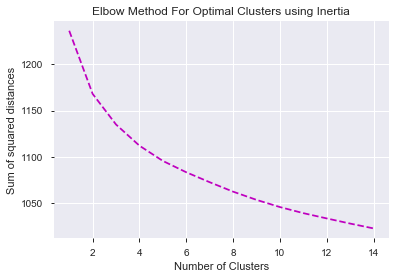

In [37]:
# Plot the inertia scores

plt.plot(K, Sum_of_squared_distances, 'mx--')
plt.xlabel('Number of Clusters')
plt.ylabel('Sum of squared distances')
plt.title('Elbow Method For Optimal Clusters using Inertia')
plt.show()

In [38]:
# Let's do the same thing as above except with silhouette score

scores = []
cluster_count = []
for i in range(2,29,1):
    print(i)
    km = KMeans(n_clusters=i)
    km.fit(df_for_modeling)
    pred =km.predict(df_for_modeling)
    scores.append(sc(df_for_modeling, pred))
    cluster_count.append(i)

2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28


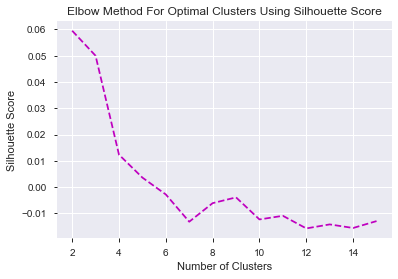

In [39]:
# Plot the silhouette scores
plt.plot(cluster_count[:14], scores[:14], 'mx--')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.title('Elbow Method For Optimal Clusters Using Silhouette Score');

In [40]:
# Do a final clustering with 7 clusters, as this number pops up in my LSA scree, my silhouette score plot, and
# my inertia score plot

num_clusters = 7
km7 = KMeans(n_clusters=num_clusters, init='k-means++', random_state=42, n_init=1) 
km7.fit(df_for_modeling)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=7, n_init=1, n_jobs=None, precompute_distances='auto',
       random_state=42, tol=0.0001, verbose=0)

In [41]:
abca_df['clusters'] = km7.labels_

C:\Users\tengw\Anaconda3\envs\dsi\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [42]:
abca_df['clusters'].value_counts()

1    4670
2    4338
3    4298
5    3311
0    2365
6    2064
4    1286
Name: clusters, dtype: int64

In [43]:
abca_df[abca_df['clusters'] == 5]['Plot'].sample(10)

19541    three prisoners nearing the end of their jail ...
825      on a volcanic island near the kingdom of hetvi...
14155    ten years after the trade federation's invasio...
18352    robert norman is shot dead at his home. inspec...
15463    genius, billionaire, and playboy tony stark, w...
19840    in a cornish village in august 1860, the inhab...
6571     told in a narrative style, popularized by the ...
3617     lt. richard houston (richard arlen) is an offi...
12622    the film opens in the small town of "liberty",...
14767    in the near future, the united states navy dev...
Name: Plot, dtype: object

In [44]:
abca_df[abca_df['clusters'] == 2]['Genre'].value_counts()

comedy                                                     887
drama                                                      493
horror                                                     324
western                                                    245
unknown                                                    179
animation                                                  149
crime drama                                                129
thriller                                                   124
animated                                                   115
action                                                     111
crime                                                       93
science fiction                                             90
adventure                                                   80
family                                                      72
animated short                                              72
musical                                                

<div class="alert alert-block alert-info">
7 clusters were created using the KMeans model, but more exploration of the words used to differentiate the clusters is needed. When the genres of each cluster was examined, there appeared to be a lot of overlap.
</div>

<div class="alert alert-block alert-info">
DBScan was used to figure out how many clusters was needed for the genres, but the model did not generate any clusters at all.
</div>

## Exploratory Data Analysis

### Movies by Release Year

In [45]:
df[df['Release_Year'] == 1987]

,Release_Year,Title,Origin/Ethnicity,Director,Cast,Genre,Wiki_Page,Plot,cast_no_spaces,director_no_spaces,title_no_spaces,movie
10642,1987,84 charing cross road,American,david jones,"anne bancroft, anthony hopkins, judi dench",drama,https://en.wikipedia.org/wiki/84_Charing_Cross...,"in 1949, helene hanff is in search of obscure ...",anne_bancroft anthony_hopkins judi_dench,david_jones,84_charing_cross_road,anne_bancroft anthony_hopkins judi_dench david...
10643,1987,adventures in babysitting,American,chris columbus,"elisabeth shue, maia brewton, keith coogan, an...",comedy,https://en.wikipedia.org/wiki/Adventures_in_Ba...,after her boyfriend mike cancels their anniver...,elisabeth_shue maia_brewton keith_coogan antho...,chris_columbus,adventures_in_babysitting,elisabeth_shue maia_brewton keith_coogan antho...
10644,1987,allan quatermain and the lost city of gold,American,gary nelson,"richard chamberlain, sharon stone, james earl ...",adventure,https://en.wikipedia.org/wiki/Allan_Quatermain...,after surviving their expedition to king solom...,richard_chamberlain sharon_stone james_earl_jones,gary_nelson,allan_quatermain_and_the_lost_city_of_gold,richard_chamberlain sharon_stone james_earl_jo...
10645,1987,the allnighter,American,tamar simon hoffs,"susanna hoffs, joan cusack",comedy,https://en.wikipedia.org/wiki/The_Allnighter_(...,"molly (hoffs), val (pfeiffer) and gina (cusack...",susanna_hoffs joan_cusack,tamar_simon_hoffs,the_allnighter,susanna_hoffs joan_cusack tamar_simon_hoffs th...
10646,1987,amazing grace and chuck,American,mike newell,"jamie lee curtis, gregory peck, william l. pet...",drama,https://en.wikipedia.org/wiki/Amazing_Grace_an...,"chuck murdock (joshua zuehlke), a 12-year-old ...",jamie_lee_curtis gregory_peck william_l._peter...,mike_newell,amazing_grace_and_chuck,jamie_lee_curtis gregory_peck william_l._peter...
10647,1987,amazon women on the moon,American,5 directors,"arsenio hall, carrie fisher, sybil danning, gr...","comedy, parody",https://en.wikipedia.org/wiki/Amazon_Women_on_...,fictional television station widb-tv (channel ...,arsenio_hall carrie_fisher sybil_danning griff...,5_directors,amazon_women_on_the_moon,arsenio_hall carrie_fisher sybil_danning griff...
10648,1987,american ninja 2: the confrontation,American,sam firstenberg,"michael dudikoff, steve james",action,https://en.wikipedia.org/wiki/American_Ninja_2...,"now promoted to army rangers, joe armstrong (m...",michael_dudikoff steve_james,sam_firstenberg,american_ninja_2:_the_confrontation,michael_dudikoff steve_james sam_firstenberg a...
10649,1987,angel heart,American,alan parker,"mickey rourke, lisa bonet, robert de niro, cha...",mystery,https://en.wikipedia.org/wiki/Angel_Heart,"in 1955, harry angel, a new york city private ...",mickey_rourke lisa_bonet robert_de_niro charlo...,alan_parker,angel_heart,mickey_rourke lisa_bonet robert_de_niro charlo...
10650,1987,anguish,American,bigas luna,"zelda rubinstein, michael lerner",horror,https://en.wikipedia.org/wiki/Anguish_(film),the film begins with a written disclaimer:\r\n...,zelda_rubinstein michael_lerner,bigas_luna,anguish,zelda_rubinstein michael_lerner bigas_luna ang...
10651,1987,anna,American,yurek bogayevicz,"sally kirkland, paulina porizkova, robert fields",drama,https://en.wikipedia.org/wiki/Anna_(1987_film),"the story of a czech actress, looking for work...",sally_kirkland paulina_porizkova robert_fields,yurek_bogayevicz,anna,sally_kirkland paulina_porizkova robert_fields...


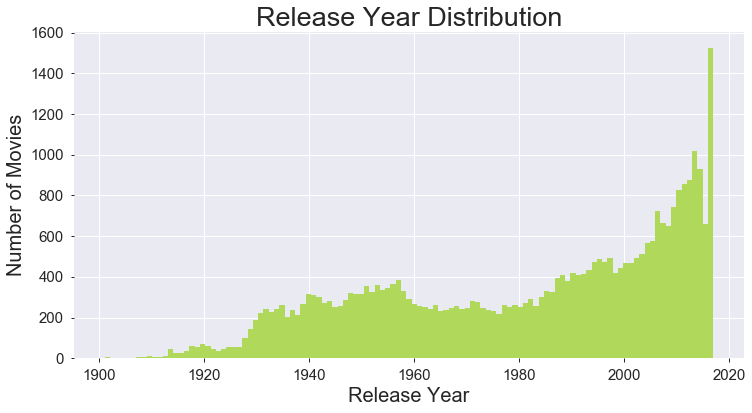

In [46]:
# Create a histogram of the "Release_Year"
plt.figure(figsize=(12, 6))
plt.hist(df['Release_Year'], bins=115, color='#b0d85b')
plt.title("Release Year Distribution", fontsize = 27)
plt.ylabel("Number of Movies", fontsize = 20)
plt.xlabel("Release Year", fontsize = 20)
# plt.xlim(left=0, right=10_000)
# plt.ylim(top=100_000)
plt.yticks(fontsize=15)
plt.xticks(fontsize=15);

### Top Genres

In [47]:
df['Genre'].value_counts().head(15)

unknown            6079
drama              5959
comedy             4378
horror             1166
action             1097
thriller            965
romance             923
western             864
science fiction     639
historical          582
romantic comedy     580
crime               568
comedy drama        538
crime drama         528
adventure           525
Name: Genre, dtype: int64

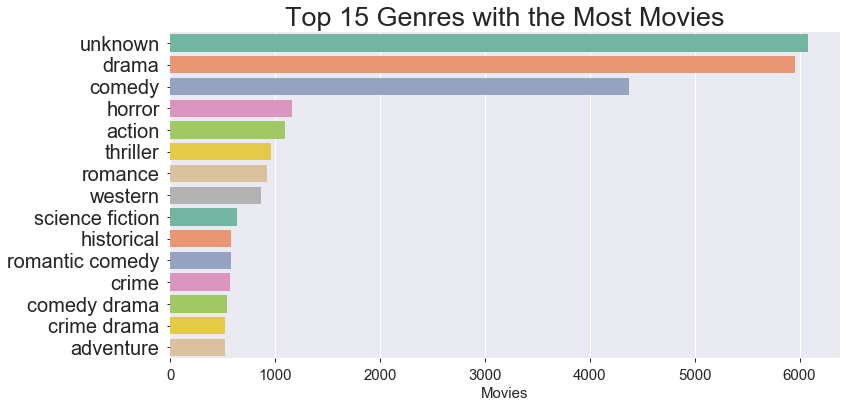

In [48]:
# Plot the top 15 with the most movies
plt.figure(figsize=(12, 6))
sns.barplot(y=df['Genre'].value_counts().head(15).index, x=df['Genre'].value_counts().head(15), palette="Set2")
plt.title("Top 15 Genres with the Most Movies", fontsize = 27)
# plt.ylabel("Movies", fontsize = 20)
plt.xlabel("Movies", fontsize = 15)
plt.yticks(fontsize=20)
plt.xticks(fontsize=15);

### Top Directors

In [49]:
top_directors = df['director_no_spaces'].value_counts().head(16)

In [50]:
top_directors = top_directors[1:]

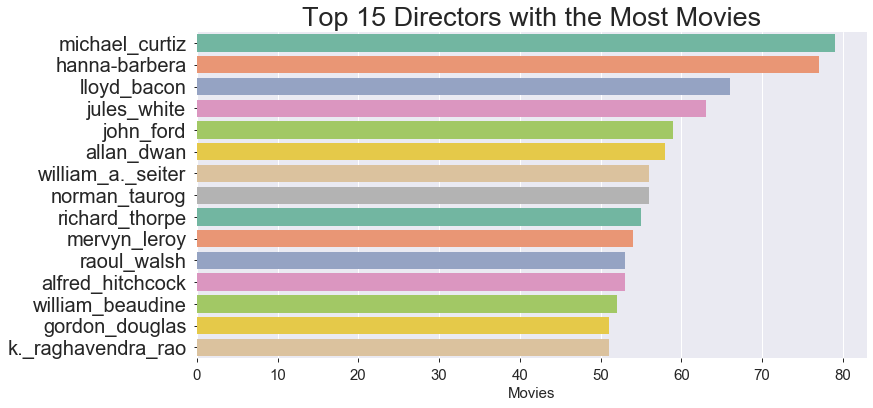

In [51]:
# Plot the top 15 directors with the most movies
plt.figure(figsize=(12, 6))
sns.barplot(y=top_directors.index, x=top_directors, palette="Set2")
plt.title("Top 15 Directors with the Most Movies", fontsize = 27)
# plt.ylabel("Movies", fontsize = 20)
plt.xlabel("Movies", fontsize = 15)
plt.yticks(fontsize=20)
plt.xticks(fontsize=15);

### Top Casts

In [52]:
# Create a list of top casts - enough so that I can remove the unknowns and still be left with 15
top_casts = df['cast_no_spaces'].value_counts().head(21)

In [53]:
top_casts

                              1420
three_stooges                  103
tom_and_jerry                   80
looney_tunes                    37
bugs_bunny                      36
                                32
abbott_and_costello             17
harold_lloyd                    17
buster_keaton                   14
drama                           14
arthur_lucan kitty_mcshane      12
basil_rathbone nigel_bruce      10
jackie_chan                      9
comedy                           9
mary_pickford                    8
sid_james kenneth_williams       7
mammootty                        7
leo_gorcey huntz_hall            7
dean_martin jerry_lewis          7
stan_laurel oliver_hardy         7
roy_rogers dale_evans            6
Name: cast_no_spaces, dtype: int64

In [54]:
# Drop unknowns with empty casts and genre descriptions as a fill in
top_casts = top_casts.drop(top_casts.index[0])
top_casts = top_casts.drop(top_casts.index[4])
top_casts = top_casts.drop(top_casts.index[6])
top_casts = top_casts.drop(top_casts.index[9])

In [55]:
top_casts

three_stooges                 103
tom_and_jerry                  80
looney_tunes                   37
bugs_bunny                     36
abbott_and_costello            17
harold_lloyd                   17
drama                          14
arthur_lucan kitty_mcshane     12
basil_rathbone nigel_bruce     10
comedy                          9
mary_pickford                   8
sid_james kenneth_williams      7
mammootty                       7
leo_gorcey huntz_hall           7
dean_martin jerry_lewis         7
stan_laurel oliver_hardy        7
roy_rogers dale_evans           6
Name: cast_no_spaces, dtype: int64

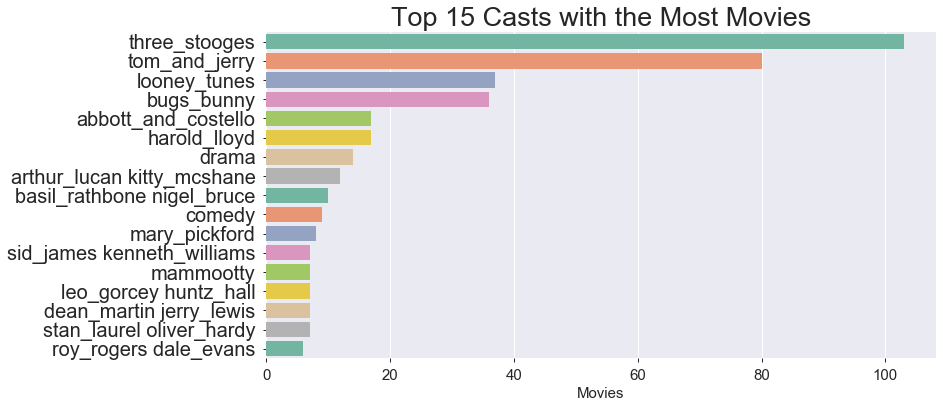

In [56]:
# Plot the top 15 actors with the most movies
plt.figure(figsize=(12, 6))
sns.barplot(y=top_casts.index, x=top_casts, palette="Set2")
plt.title("Top 15 Casts with the Most Movies", fontsize = 27)
# plt.ylabel("Movies", fontsize = 20)
plt.xlabel("Movies", fontsize = 15)
plt.yticks(fontsize=20)
plt.xticks(fontsize=15);

## Create a Pivot Table for Export to Flourish

In [57]:
# Generate a list of the top 50 genres by movie count
top_genres = df["Genre"].value_counts().head(50)

In [58]:
# Create a dataframe with only a subset containing the top 50 genres
top_genres_movies = df[df["Genre"].isin(top_genres.index)]

In [59]:
# Create a pivot table of movies by year by genre
top_genres_movies_year = pd.pivot_table(top_genres_movies, 
                                        index=["Release_Year"], 
                                        values=["Title"], 
                                        columns=["Genre"], 
                                        aggfunc=[np.count_nonzero])

In [60]:
top_genres_movies_year.fillna(0, inplace=True)

In [61]:
# Group the movies by decade
top_genres_movies_decade = top_genres_movies_year.groupby((top_genres_movies_year.index//10)*10).sum().T

In [62]:
top_genres_movies_decade.head()

Release_Year                         1900  1910  1920  1930  1940  1950  1960  \
                    Genre                                                       
count_nonzero Title action            0.0   0.0   2.0  16.0   9.0  15.0  24.0   
                    action comedy     0.0   0.0   0.0   0.0   2.0   0.0   1.0   
                    action drama      0.0   0.0   0.0   0.0   0.0   3.0   0.0   
                    action thriller   0.0   0.0   0.0   0.0   0.0   0.0   1.0   
                    action, drama     0.0   0.0   0.0   0.0   0.0   0.0   1.0   

Release_Year                         1970   1980   1990   2000   2010  
                    Genre                                              
count_nonzero Title action           82.0  157.0  242.0  268.0  282.0  
                    action comedy     5.0    6.0   19.0   20.0   35.0  
                    action drama      2.0    1.0    1.0    2.0   27.0  
                    action thriller   0.0    1.0    2.0   18.0   51.0  
                    action, drama     1.0   10.0   12.0    9.0   13.0

In [63]:
# Save the pivot to a csv file to be uploaded to Flourish
top_genres_movies_decade.to_csv('../data/top_genres_movies_decade.csv')

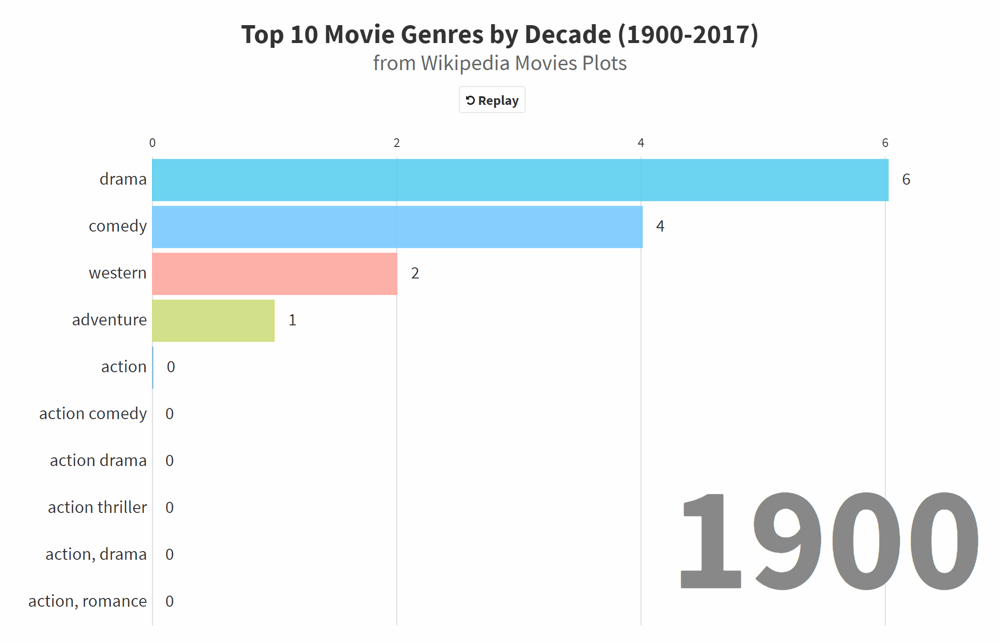

In [64]:
# Referenced the following site to see how to display a gif in Jupyter Notebook:
# https://www.numfys.net/howto/animations/

with open('../visuals/Top 10 Movie Genres by Decade 1900-2017.gif','rb') as file:
    display(Image(file.read()))

<div class="alert alert-block alert-info">
Referenced the following for instructions on building a bar chart race: https://towardsdatascience.com/step-by-step-tutorial-create-a-bar-chart-race-animation-da7d5fcd7079
    <br>    
    
Link to bar chart race at Flourish: https://public.flourish.studio/visualisation/598096/
</div>

## Generate Vectors and Save

In [65]:
# Function to create a nested list of tokenized words for movie

def clean_words(word_column):
    words_tokens = []
    for word in word_column:  
        if word not in english_stop_words:

            # regex ref: https://www.machinelearningplus.com/python/python-regex-tutorial-examples/
            words = re.sub('http\S+\s*', '', word)
            tokenizer = RegexpTokenizer('[a-zA-Z]\w+')
            word_tokens = tokenizer.tokenize(words.lower())
            words_tokens.append(word_tokens)
    return words_tokens

In [66]:
X = clean_words(df['movie'])

In [67]:
X[:5]

[['kansas_saloon_smashers',
  'unknown',
  'bartender',
  'is',
  'working',
  'at',
  'saloon',
  'serving',
  'drinks',
  'to',
  'customers',
  'after',
  'he',
  'fills',
  'stereotypically',
  'irish',
  'man',
  'bucket',
  'with',
  'beer',
  'carrie',
  'nation',
  'and',
  'her',
  'followers',
  'burst',
  'inside',
  'they',
  'assault',
  'the',
  'irish',
  'man',
  'pulling',
  'his',
  'hat',
  'over',
  'his',
  'eyes',
  'and',
  'then',
  'dumping',
  'the',
  'beer',
  'over',
  'his',
  'head',
  'the',
  'group',
  'then',
  'begin',
  'wrecking',
  'the',
  'bar',
  'smashing',
  'the',
  'fixtures',
  'mirrors',
  'and',
  'breaking',
  'the',
  'cash',
  'register',
  'the',
  'bartender',
  'then',
  'sprays',
  'seltzer',
  'water',
  'in',
  'nation',
  'face',
  'before',
  'group',
  'of',
  'policemen',
  'appear',
  'and',
  'order',
  'everybody',
  'to',
  'leave'],
 ['love_by_the_light_of_the_moon',
  'unknown',
  'the',
  'moon',
  'painted',
  'with'

In [ ]:
# Create a timer to see how long the model takes to instantiate
# Referenced https://pythonhow.com/measure-execution-time-python-code/
import time
start = time.time()

# Instantiate a model
w2v = Word2Vec(X,     # Corpus of data.
               size=300,    # How many dimensions do you want in your word vector?
               window=5,    # How many "context words" do you want?
               min_count=1, # Ignores words below this threshold.
               sg=1,        # SG = 1 uses SkipGram, SG = 0 uses CBOW (default).
               workers=4,   # Number of "worker threads" to use (parallelizes process).
               hs=1, 
               negative=0);   

end = time.time()
print(end - start)

In [ ]:
# Create word vectors file
word_vectors = w2v.wv

In [ ]:
# Referenced the following on how to save the word_vectors
# https://stackoverflow.com/questions/27324292/convert-word2vec-bin-file-to-text
word_vectors.save_word2vec_format("../data/wiki_movies_skipgram.vec")

## References
- https://stackoverflow.com/questions/18039057/python-pandas-error-tokenizing-data
- https://stackoverflow.com/questions/8784396/how-to-delete-the-words-between-two-delimiters
- https://www.machinelearningplus.com/python/python-regex-tutorial-examples/
- https://github.com/danielwilentz/Cuisine-Classifier/blob/master/topic_modeling/clustering.ipynb
- https://medium.com/hanman/data-clustering-what-type-of-movies-are-in-the-imdb-top-250-7ef59372a93b
- https://stackoverflow.com/questions/44636370/scikit-learn-gridsearchcv-without-cross-validation-unsupervised-learning
- https://stackoverflow.com/questions/55143629/attributeerror-slice-object-has-no-attribute-flags-error
- https://towardsdatascience.com/step-by-step-tutorial-create-a-bar-chart-race-animation-da7d5fcd7079 
- https://www.numfys.net/howto/animations/
- https://pythonhow.com/measure-execution-time-python-code/
- https://stackoverflow.com/questions/27324292/convert-word2vec-bin-file-to-text